# Clustering Tweeters

In the previous lab we saw how to generate a Tweeter dataset. However, it might takes time to generate a dataset of a certain size (you can also take a look at the streeming API so that the application streams down post mathing your query).

We will use the Tweeter corpus from Stanford University which contains 1.6 Mil tweets collected Apr and June 2006. However, for our experiments I have created the "Tweet-3000.txt" file containing 3,000 tweets.

After this lab, feelf free to experiment with larger datasets.

In [1]:
import numpy as np
import pandas as pd
import nltk
import re
import os
import codecs
from sklearn import feature_extraction
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

### Loading the 3,000 Tweets

In [2]:
def remove_utf(text):
    return re.sub(r'[^\x00-\x7f]',r' ',text)

def remove_tinyURL(text):
    return re.sub(r'http\S+',r'',text)

path = "C:\\tmp\\Tweet-3000.txt"

dataset = set()
file_input = open (path,"r")
lines = file_input.readlines()
for line in lines:
    dataset.add(remove_tinyURL(remove_utf(line.lower())))
file_input.close()

print len(dataset)

2993


### Preprocessing Text

We will create two sets: a set containing all the tokens and another containing their lemmatized version.

<b>It would also make sense to use the Tweet Tokenizer which was not included in this lab. Also, stemming/lemmatization is not recommended in processing social media data.

Experiment with the code and tune-up the pre-processing task so to better handle social media data.</b>

In [3]:
def remove_punctuation(text):
    punctuations = ".,\"-\\/#!?$%\^&\*;:{}=\-_'~()"    
    filtered_text = [token for token in text if (not token in punctuations)]
    return filtered_text

def apply_stopwording(text, min_len):
    filtered_text = [token for token in text if (not token in stopwords.words('english') and len(token)>min_len)]
    return filtered_text

def apply_stemming(text):
    stemmer = nltk.PorterStemmer()
    normalized_text = [stemmer.stem(token) for token in text]
    return normalized_text

def apply_lemmatization(text):
    lemmatizer = nltk.WordNetLemmatizer()
    
    #normalized_text = [lemmatizer.lemmatize(token) for token in text]
    normalized_text = []
    
    for token in text:
        try:
            lemma = lemmatizer.lemmatize(token)
            normalized_text.append(lemma)
        except:
            print "Error: %s" % token
        
    return normalized_text

def remove_tweet_tags(text):
    text = re.sub('#(\w+)','',text)
    text = re.sub('@(\w+)','',text)
    return text
    

clean_tweets= []
tokenized_tweet = []
index = 1
for tweet in dataset:
    index+=1
    tokens = apply_stopwording(remove_punctuation(nltk.Text(nltk.word_tokenize(remove_tweet_tags(tweet)))), 3)
    clean_text = apply_stemming(tokens)
    print '[%s] - %s' % (index, clean_text)
    clean_tweets.append(clean_text)
    tokenized_tweet.append(tokens)

    

[2] - [u'sorri', u'love', u'stupid', u'date', u'coach', u'make', u'feel', u'self-consci', u'hair']
[3] - [u'engag', u'muppet', u'orlando', u'realis', u'cant', u'marri', u'justin', u'timberlak']
[4] - [u'mean', u'sign', u'back', u'gone']
[5] - [u'want', u'walk', u'home', u'snow', u'want', u'pick']
[6] - [u'birthday', u'today', u'feel']
[7] - []
[8] - [u'struggl', u'regard', u'fact', u'danc', u'day', u'away', u'side', u'vacat']
[9] - [u'well', u'much', u'product', u'day', u'angel']
[10] - [u'train', u'ram', u'fellow', u'commut', u'vile', u'special', u'deris', u'reserv', u'appear', u'nowher', u'claim', u"'hi", u'seat', u'luggag', u'rack']
[11] - [u'sigh', u'mostli', u'miss', u'hsnging', u'friend', u'damn', u'grow', u'yeah', u'miss', u'abl', u'spell']
[12] - [u'know', u'night', u'natur', u'hahaha', u'time', u'zone', u'behind', u'almost']
[13] - [u'tire', u'reason', u'go', u'late', u'sleep', u'late', u'make', u'angri']
[14] - [u'debbug', u'code', u'could', u'start', u'better']
[15] - [u'loo

Let's create a Pandas dataframe containing the tokens and their correspondent lemmas

In [4]:
lemmas_list=[]
token_list=[]

lemmas_list.extend(l for lemma in clean_tweets for l in lemma)
token_list.extend(t for token in tokenized_tweet for t in token)

token_dataframe = pd.DataFrame({'terms': token_list}, index = lemmas_list)
print token_dataframe.head(10)

                      terms
sorri                 sorry
love                   love
stupid               stupid
date                 dating
coach                 coach
make                  makes
feel                   feel
self-consci  self-conscious
hair                   hair
engag               engaged


### Generate Tf-IDF measures

As you learned from previous labs, we will calculate the Tf-IDF scores for each term in our document-term matrix using the TfidfVectorizer object implementation from the sklearn package.

Here we extend the use of it, including other parameters:

    max_df: maximum document frequency of a term. If the term has higher df it will be ignore (the term is too common)
    min_df: minimum document frequency of a term. If the term has lower df it will be ignore (the term is too uncommon/specific)
    max_features: maximum number of feature to consider. Useful when dealing with computational limits
    stop_words: if the term matches the internal stop-word dictionary it will be ignored. Useful for an extra pass
    use_idf: if 'True' it will generate tf-idf weights
    ngram_range: the min and max values for different n-grams to be extracted
    tokenizer: the preprocessing function that will tokenize and transform each token

You can also pass raw data and specify a preprocessing function if needed. Because you might want to control the preprocessing steps we performed this step ahead of time.
        

In [5]:
from sklearn.feature_extraction.text import TfidfVectorizer

terms=[str(set(token)) for token in clean_tweets]

#define vectorizer parameters
tfidf_vectorizer = TfidfVectorizer(stop_words='english', use_idf=True)
tfidf_matrix = tfidf_vectorizer.fit_transform(terms)

print(tfidf_matrix.shape)

(2993, 4414)


Let's get the list of features. It is always a good idea to take a look at the feature set so to go back and remove any unwanted and noisy term.

In [6]:
features = tfidf_vectorizer.get_feature_names()
print features

[u'00', u'000', u'002', u'00am', u'05am', u'08', u'10', u'1000', u'1000000', u'1001', u'100mb', u'100th', u'1099', u'10am', u'10ish', u'10pm', u'10pt', u'10th', u'11', u'1110', u'117', u'118', u'11pm', u'12', u'1234', u'12player', u'132am', u'13th', u'143', u'14th', u'15', u'1500', u'15th', u'17', u'18', u'18th', u'2008', u'2009', u'200db', u'200ml', u'2010', u'20pm', u'224am', u'2359hr', u'23rd', u'24', u'24pm', u'2552', u'25th', u'273', u'28th', u'2day', u'2moro', u'2morow', u'2morw', u'2night', u'30', u'3000', u'30am', u'310', u'31st', u'330ci', u'39', u'3tfan', u'3yr', u'40am', u'43', u'45', u'45am', u'45pm', u'4chan', u'4easter', u'4skinmus', u'52', u'536', u'54', u'5564583833755523', u'5minut', u'600m', u'6680', u'70000', u'7yr', u'80', u'8080', u'8900', u'8x18', u'90210', u'________', u'_secretgarden_', u'a330', u'aaaaaaaa', u'aaaaaaaaaah', u'aaaaand', u'aaaah', u'aaliyah', u'aalsmeer', u'aawwwww', u'abi', u'abit', u'abl', u'absolut', u'absolutli', u'abus', u'ac', u'accent', u'a

### kMeans Clustering

With the TfIDF weights we will cluster the tweeter dataset in order to identify hidden structures within the tweets.
Because we don't have any idea you will pick an arbitrary number of clusters and then go for there. There are algorithms that can execute several run for the same k and then generate the optimal solution by assigning the points to the same cluster based on the amount of time the same point as been assigned to that cluster.

You can check the amount of time the kMeans runs by using the '%time' notation

In [7]:
from sklearn.cluster import KMeans

k = 10
k_means = KMeans(n_clusters=k)
%time k_means.fit(tfidf_matrix)

Wall time: 2 s


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

We can use a Pandas dataframe to easily analyze the clustering solution.

In [8]:
clusters = k_means.labels_.tolist()
tweets_space = {'term':terms, 'cluster':clusters}
kmean_dataframe = pd.DataFrame(tweets_space,index=[clusters], columns =['term','cluster'])

#### Number of elements per cluster

In [9]:
kmean_dataframe['cluster'].value_counts()

6    1924
7     190
5     170
3     133
9     129
1     113
2     104
4      81
8      80
0      69
Name: cluster, dtype: int64

#### Top terms in each cluster

The top terms are the tokens that are closer to the centroids of each cluster. In order to determine them we need to get the centroids and then determine the top n words closest to each of the k centroids

In [10]:
n=10

print 'Top %s terms within clusters' % n
print()

sorted_centroids = k_means.cluster_centers_.argsort()[:, ::-1]

for cluster_number in range(k):
    token_string = ''
    
    for ind in sorted_centroids[cluster_number, :n]:
        token_string = token_string + token_dataframe.ix[features[ind].split(' ')].values.tolist()[0][0] + ', '
    
    print "Cluster %d: %s" % (cluster_number, token_string)


Top 10 terms within clusters
()
Cluster 0: hates, sets, waiting, everyone, sick, sleeping, need, cooking, love, know, 
Cluster 1: home, coming, sets, soon, work, want, wish, boring, baby, hope, 
Cluster 2: feel, sick, sets, better, really, today, hope, good, poor, think, 
Cluster 3: miss, sets, watching, friends, love, girl, phone, talk, tonight, wednesday, 
Cluster 4: night, sets, sleeping, work, hours, late, hope, tired, know, today, 
Cluster 5: work, sets, today, trying, morning, wish, week, tomorrow, sick, hard, 
Cluster 6: sets, want, need, today, think, time, good, morning, twitter, wish, 
Cluster 7: like, know, sets, feel, looking, things, dont, want, twitter, really, 
Cluster 8: sorry, hear, sets, feel, awww, tweets, miss, love, understand, coming, 
Cluster 9: sleeping, sets, hours, tired, need, work, tomorrow, want, morning, waking, 


# Displaying the Cluster

It migth be useful to explore the clustering solution visually. However, we are dealing with vectors in the multi-dimensional features space. 

There are several methods to display multi-dimensional features in a bi-dimensional space: one is PCA and the other is Multidimensional Scaling. We covered PCA in other classes, so for this purpose I use Multidimensional scaling. We will not cover this method, but suffice to say that we will map points in the hyper-space into a bi-dimensional plane.

In order to apply this method we will need to provide a distance function that makes sense with our data. We know that Euclidean function does not work well with textual data, so we will provide what is call Cosine-Distance which is defined as 1-cosine(x,y) with (x,y) pairs of tweets. This is a distance function because if two document are the same the cosine is 1 and we want to have a distance of 0 (and viceversa).

In [11]:
from sklearn.metrics.pairwise import cosine_similarity
cosine_distance = 1 - cosine_similarity(tfidf_matrix)

In [12]:
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.manifold import MDS

MDS()

# Because we will provide the distance function the dissimilarity parameter will be set to "precomputed"
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)
pos = mds.fit_transform(cosine_distance)

xs, ys = pos[:, 0], pos[:, 1]

# Visualizing Clusters of Tweets

#### Setting up the plotting properties

In [13]:
#Here we setup different colors for each cluster. Make sure you have as many elements in this dictionary as the number of clusters
# You can refer to http://www.rapidtables.com/web/color/RGB_Color.htm for more codes
cluster_colors = {0:'#ff0000', 1:'#00FF00', 2:'#0000FF', 3:'#994c00', 4:'#ff33ff', 
                  5:'#cc6600', 6:'#b266ff', 7:'#a0a0a0', 8:'#000000', 9:'#ffccff'}

#set up cluster names using a dict
cluster_names = {0: 'Tags for Cluster 0', 
                 1: 'Tags for Cluster 0', 
                 2: 'Tags for Cluster 0', 
                 3: 'Tags for Cluster 0', 
                 4: 'Tags for Cluster 0',
                 5: 'Tags for Cluster 0', 
                 6: 'Tags for Cluster 0', 
                 7: 'Tags for Cluster 0', 
                 8: 'Tags for Cluster 0',
                 9: 'Tags for Cluster 0'}

#### Plotting the cluster solution with matplotlib inline plots

Saving the coordinates we calculated before into a dataframe

In [14]:
%matplotlib inline 

xy_df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, lemmas=terms)) 
groups = xy_df.groupby('label')

Generate the cluster map

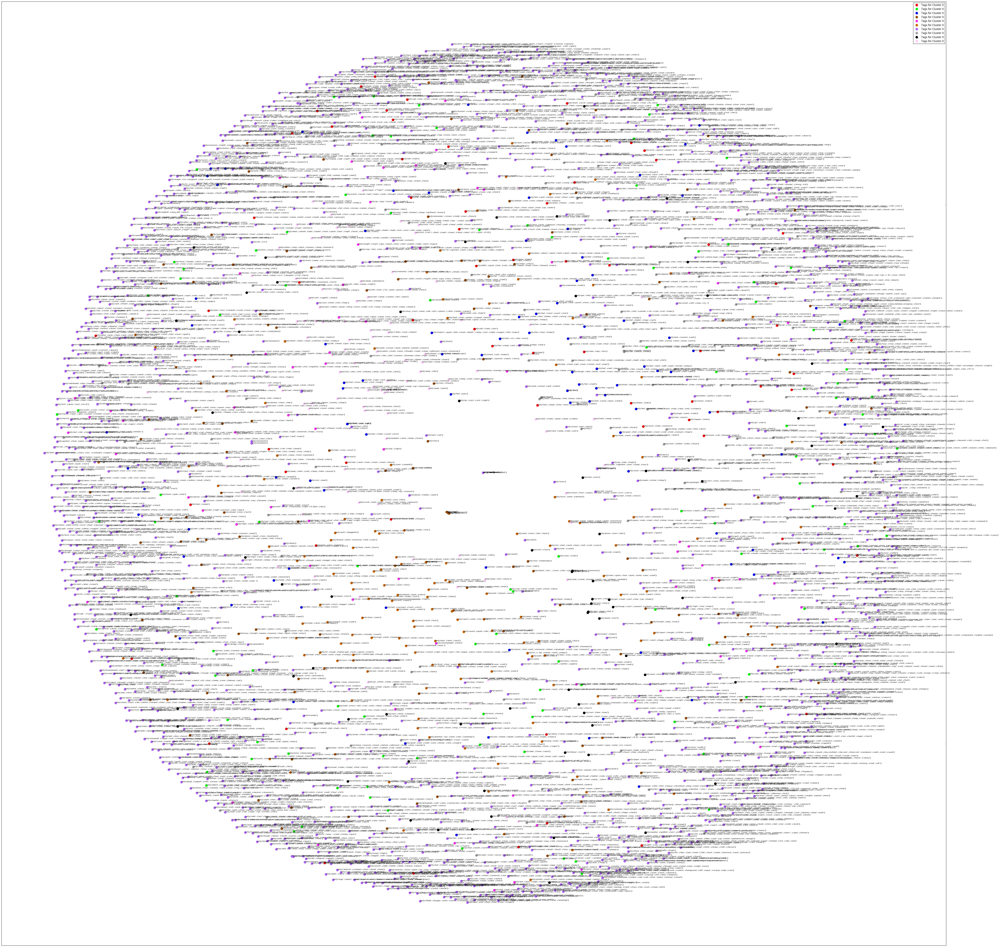

In [15]:
fig, ax = plt.subplots(figsize=(80, 80))
ax.margins(0.05)

for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=12, 
            label=cluster_names[name], color=cluster_colors[name], 
            mec='none')
    ax.set_aspect('auto')
    ax.tick_params(\
        axis= 'x',         # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')
    ax.tick_params(\
        axis= 'y',         # changes apply to the y-axis
        which='both',      # both major and minor ticks are affected
        left='off',        # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelleft='off')
    
ax.legend(numpoints=1)  #show legend with only 1 point

#add label in x,y position with the label as the film title
for i in range(len(xy_df)):
    ax.text(xy_df.ix[i]['x'], xy_df.ix[i]['y'], xy_df.ix[i]['lemmas'], size=8)  

    
    
plt.show() #show the plot

### Saving the Plot
You can save the plot as image by right-clicking on the image and 'Save-As'. Matplot also as the savefig method:

    filename = 'C:\\tmp\\Tweeter_cluster.png'
    plt.savefig(filename, dpi=200)
    plt.close()

But it did not really work for me.

### Displaying about 4,500 features might not be an effective exploratory tool. Try to reduce the # of tweets to get familiar with the output and then increase the information space.

Brandon Rose does a great work in exploratory analysis and I am reporting his work on generating clustering points using the Javascript library mpld3 that brings together Python's Matplotlib library with D3js, the popular JavaScript library for creating interactive data visualizations for the web.

### Install mpld3 library

In [18]:
import mpld3

#define custom toolbar location
class TopToolbar(mpld3.plugins.PluginBase):
    """Plugin for moving toolbar to top of figure"""

    JAVASCRIPT = """
    mpld3.register_plugin("toptoolbar", TopToolbar);
    TopToolbar.prototype = Object.create(mpld3.Plugin.prototype);
    TopToolbar.prototype.constructor = TopToolbar;
    function TopToolbar(fig, props){
        mpld3.Plugin.call(this, fig, props);
    };

    TopToolbar.prototype.draw = function(){
      // the toolbar svg doesn't exist
      // yet, so first draw it
      this.fig.toolbar.draw();

      // then change the y position to be
      // at the top of the figure
      this.fig.toolbar.toolbar.attr("x", 150);
      this.fig.toolbar.toolbar.attr("y", 400);

      // then remove the draw function,
      // so that it is not called again
      this.fig.toolbar.draw = function() {}
    }
    """
    def __init__(self):
        self.dict_ = {"type": "toptoolbar"}

In [32]:
#group by cluster
groups = xy_df.groupby('label')

#define custom css to format the font and to remove the axis labeling
css = """
text.mpld3-text, div.mpld3-tooltip {
  font-family:Arial, Helvetica, sans-serif;
}

g.mpld3-xaxis, g.mpld3-yaxis {
display: none; }

svg.mpld3-figure {
margin-left: -200px;}
"""

# Plot 
fig, ax = plt.subplots(figsize=(30,30)) #set plot size
ax.margins(0.01) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    points = ax.plot(group.x, group.y, marker='o', linestyle='', ms=18, 
                     label=cluster_names[name], mec='none', 
                     color=cluster_colors[name])
    ax.set_aspect('auto')
    labels = [i for i in group.lemmas]
    
    #set tooltip using points, labels and the already defined 'css'
    tooltip = mpld3.plugins.PointHTMLTooltip(points[0], labels,voffset=10, hoffset=10, css=css)
    
    #connect tooltip to fig
    mpld3.plugins.connect(fig, tooltip, TopToolbar())    
    
    #set tick marks as blank
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    
    #set axis as blank
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

    
ax.legend(numpoints=1) #show legend with only one dot

mpld3.display() #show the plot

#uncomment the below to export to html
#html = mpld3.fig_to_html(fig)
#print(html)